# 1. Первичный анализ данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import numpy as np
import random

#библиотека sklearn
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import StandardScaler


#библиотека градиентного бустинга
from catboost import CatBoostClassifier

In [2]:
#Построение boxplot'a
def boxplot(df):
    plt.figure(figsize=(50,500))
    for i in range(21):
        for j in range(2):
            if i * 2 + j < 42:
                plt.subplot(21, 2, i*2+j+1)
                plt.title(columns[i*2+j], fontsize=50)
                plt.tick_params(axis='both', which='major', labelsize=40)
                plt.ylabel(columns[i*2+j], fontsize=40)
                sns.boxplot(y=columns[i*2+j], fliersize = 30, color = cmap(i*2+j), linewidth = 6, data=df)
            else:
                break
                
#Построение kdeplot'a
def kdeplot(df):
    plt.figure(figsize=(50,500))
    plt.grid(which='major',
        color = 'k', linestyle='-')
    for i in range(21):
        for j in range(2):
            if i * 2 + j < 42:
                plt.subplot(21, 2, i*2+j+1)
                plt.title(columns[i*2+j], fontsize=50)
                plt.tick_params(axis='both', which='major', labelsize=40)
                plt.ylabel(columns[i*2+j], fontsize=40)
                sns.kdeplot(df[columns[i*2+j]], color = cmap(i*2+j), shade=True)
            else:
                break

                #поиск и заполнение нулевых значений                
def pass_search(df):
    for i in df_feature.columns:#признаки
    
        null = df.loc[df[i].isnull(), i]#извлечем те строки с пустыми ячейками
        not_null = list(df.loc[(~df[i].isnull()), i].unique())#создаем список значений
    
        for j in range(len(null)):
            null.iloc[j] = random.choice(not_null)#заполняем ячейки случайными значениями из списка not_null
        
        df.loc[null.index, i] = null
    #print(i)
    return df

#удаление выбросов
def del_blowout(df):
    df_copy = df.copy()
    for i in columns:
        meaning_high = df[i].mean() + 3.5 * df[i].std()
        meaning_low = df[i].mean() - 3.5 * df[i].std()
        df_copy = df_copy.loc[(df_copy[i] <= meaning_high) & (df_copy[i] >= meaning_low)]
    
    df_copy = df_copy.reset_index(drop = True)
    return df_copy

def auc_roc_chart(X, y, model, title):#данной функцией будем строить график auc_roc
    probabilities = model.predict_proba(X)#предсказание через вероятности
    probabilities_one = probabilities[:, 1]#вероятности предсказания только истинных значений
    fpr, tpr, thresholds = roc_curve(y, probabilities_one)
    #строим график
    plt.figure(figsize=(10,5))
    plt.plot(fpr, tpr)
    # ROC-кривая случайной модели
    plt.plot([0, 1], [0, 1], linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(title)
    plt.show()
    auc_roc = roc_auc_score(y, probabilities_one)
    print('Площадь под кривой = ', auc_roc)

In [3]:
#зададим некоторые настройки pandas, которые регулируют формат выводов
pd.set_option('display.max_columns', 65)
pd.set_option('display.max_rows', 65)
pd.set_option('display.width', 65)

In [4]:
df_feature = pd.read_csv('E://DS//EY_test_task_DS_N//EY_test_task_DS//train.csv')
df_target = pd.read_csv('E://DS//EY_test_task_DS_N//EY_test_task_DS//y_train.csv')

In [5]:
df_feature.head()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58
0,"-131,97405146667",12.0,"13,0",11.747860,1.0,2.0,"22,0","-27,750277493704",9.0,NaN,87.058083,"21,450413763523102",81.620517,-97.553036,16.0,-12.983080,"17,0",4.0,-18.099378,-6.732951,"4,0",5.0,1.0,5.0,"-17,9129890591338",12.0,11.0,51.471043,3.0,0.0,3.0,"2,0",18.831498,66.396910,-37.168058,NaN,4.046918,NaN,"-44,375920543996706",18.004199,-30.673090,3.361101,40.974956,0.0,11.0,-87.278260,"0,0",4.0,12.459805,3.0,"11,0",40.588345,16.957673,14.360604,"-53,415701398274706",NaN,NaN,-40.849368
1,"-48,3041715861774",9.0,"10,0",10.436009,1.0,NaN,"24,0","-25,703719919085497",8.0,0.0,16.009612,"-72,79126783832909",-6.461447,-57.383471,17.0,-16.861284,"17,0",3.0,16.198657,NaN,"4,0",2.0,1.0,NaN,"41,7047788312104",16.0,NaN,34.587850,NaN,1.0,5.0,"1,0",5.274965,143.517414,-31.440045,3.0,2.018794,31.639457,"-22,766313763779998",-34.725224,45.854345,2.832861,26.454657,0.0,10.0,-5.220776,"0,0",5.0,27.542202,2.0,NaN,27.113802,-61.457339,2.627029,"-39,6179932194784",24.686063,NaN,-45.108764
2,"100,069773659861",13.0,"11,0",18.929141,0.0,3.0,"23,0","-4,699424954438241",9.0,0.0,75.464985,"38,530414272099705",-35.334847,-74.046007,NaN,-7.208878,"16,0",NaN,-31.089034,10.123315,"5,0",6.0,3.0,7.0,"10,8242838031359",13.0,8.0,49.093965,1.0,NaN,4.0,"6,0",20.984751,84.880973,-70.628745,NaN,1.217633,105.329939,"-29,320117178615497",1.742056,12.218403,-2.028582,49.873473,1.0,11.0,-98.563257,"0,0",3.0,18.594894,3.0,"16,0",-6.896243,54.733047,-2.216517,"-35,2871838640482",25.040067,NaN,-47.242583
3,"-25,5087416417462",13.0,"12,0",46.259050,0.0,3.0,"23,0","1,2425417539191599",8.0,1.0,-114.959430,NaN,NaN,-113.523562,16.0,-3.478059,"17,0",6.0,-0.291220,-30.995198,"8,0",3.0,1.0,NaN,"39,1266106064488",17.0,12.0,48.913728,1.0,2.0,4.0,"3,0",4.363940,85.951710,-71.353546,3.0,0.331994,NaN,"-16,741315467876998",NaN,-25.815625,-1.133774,44.798576,1.0,NaN,-0.554252,"0,0",NaN,20.084705,2.0,"15,0",55.000612,-4.505556,38.156216,"-1,7639836715336101",34.969627,46.036218,-33.329253
4,"82,3194077384192",11.0,NaN,56.106711,NaN,2.0,"23,0","-55,3530578444829",7.0,0.0,-15.661521,"-64,498249348253",NaN,-109.187610,17.0,2.200664,"17,0",3.0,-72.580830,18.359769,"8,0",7.0,2.0,7.0,NaN,NaN,11.0,41.238975,3.0,0.0,3.0,"3,0",11.930483,110.830770,-38.291125,3.0,0.185845,60.799044,"-13,473520432564198",9.043501,12.348260,2.928347,NaN,1.0,10.0,-52.169032,"0,0",4.0,22.172242,2.0,"12,0",16.842511,-7.187769,60.228568,"-59,8615288163502",36.044706,36.613905,-10.534727


In [6]:
df_target.head()

,y_train
0,1
1,1
2,0
3,0
4,0


In [7]:
df_feature.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 720000 entries, 0 to 719999
Data columns (total 58 columns):
 #   Column      Non-Null Count   Dtype  
---  ------      --------------   -----  
 0   feature_1   656351 non-null  object 
 1   feature_2   647084 non-null  float64
 2   feature_3   665252 non-null  object 
 3   feature_4   662312 non-null  float64
 4   feature_5   655438 non-null  float64
 5   feature_6   637388 non-null  float64
 6   feature_7   633071 non-null  object 
 7   feature_8   637224 non-null  object 
 8   feature_9   672108 non-null  float64
 9   feature_10  635192 non-null  float64
 10  feature_11  633531 non-null  float64
 11  feature_12  657614 non-null  object 
 12  feature_13  641144 non-null  float64
 13  feature_14  658199 non-null  float64
 14  feature_15  628189 non-null  float64
 15  feature_16  657553 non-null  float64
 16  feature_17  643402 non-null  object 
 17  feature_18  646214 non-null  float64
 18  feature_19  685924 non-null  float64
 19  fe

In [8]:
df_feature.describe()

,feature_2,feature_4,feature_5,feature_6,feature_9,feature_10,feature_11,feature_13,feature_14,feature_15,feature_16,feature_18,feature_19,feature_20,feature_22,feature_23,feature_24,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_48,feature_49,feature_50,feature_52,feature_53,feature_54,feature_56,feature_57,feature_58
count,647084.000000,662312.000000,655438.000000,637388.000000,672108.000000,635192.000000,633531.000000,641144.000000,658199.000000,628189.000000,657553.000000,646214.000000,685924.000000,663822.000000,651121.000000,614819.000000,658801.000000,658645.000000,634078.000000,649592.000000,629457.000000,657530.000000,662432.000000,652531.000000,652843.000000,640849.000000,652054.000000,665423.000000,653380.000000,629138.000000,666334.000000,675845.000000,656060.000000,635410.000000,644873.000000,656647.000000,646358.000000,643118.000000,669191.000000,674824.000000,651071.000000,650024.000000,650393.000000,668272.000000,628731.000000
mean,12.329582,25.416516,0.313636,2.181676,7.902202,0.269337,18.853433,34.269546,-75.806768,17.017988,-10.156159,3.263199,-12.368892,-0.454454,4.528842,1.943738,5.241123,13.804578,12.943482,51.498964,3.087426,0.479967,3.702774,12.464287,94.001096,-40.168157,3.567278,12.817623,58.121173,-16.356616,-16.151158,1.002550,33.459435,0.873631,10.854430,-22.315613,4.150677,20.600971,2.982449,24.038880,-19.310761,16.435223,26.151189,38.319160,-37.014484
std,0.796751,20.630278,0.537229,0.770063,1.285814,0.443616,49.589405,48.882319,36.291880,1.593426,7.033101,1.564043,47.749934,16.888788,1.679696,0.826889,1.902721,2.066903,2.375069,8.740532,1.592861,0.658157,0.981093,9.490661,33.014144,26.888467,1.661151,699.298602,47.030134,18.118923,49.911629,3.001208,9.095184,0.787450,1.018276,35.161461,1.679947,6.410183,1.097317,29.136748,47.645051,45.110325,8.513754,5.990176,15.250778
min,7.000000,-72.310070,0.000000,0.000000,1.000000,0.000000,-209.150651,-189.175571,-242.437483,8.000000,-42.982325,0.000000,-269.369596,-83.560468,0.000000,0.000000,0.000000,3.000000,2.000000,8.707719,0.000000,0.000000,0.000000,-32.011616,-67.543979,-169.554805,0.000000,0.001055,-182.790369,-94.393365,-242.543540,-13.849135,-9.012487,0.000000,4.000000,-201.520935,0.000000,-10.115685,0.000000,-115.421307,-246.217734,-197.419313,-14.899675,9.648201,-112.352665
25%,12.000000,11.521055,0.000000,2.000000,7.000000,0.000000,-14.584958,1.309241,-100.322493,16.000000,-14.899146,2.000000,-44.579503,-11.856749,3.000000,1.000000,4.000000,12.000000,11.000000,45.599599,2.000000,0.000000,3.000000,6.075057,71.707997,-58.333270,2.000000,0.540490,26.492465,-28.592796,-49.862114,-1.018706,27.325280,0.000000,10.000000,-46.107128,3.000000,16.283152,2.000000,4.389595,-51.505233,-13.991406,20.418159,34.263159,-47.302072
50%,13.000000,25.435029,0.000000,2.000000,8.000000,0.000000,18.769288,34.197230,-75.806723,17.000000,-10.157789,3.000000,-12.325015,-0.455294,4.000000,2.000000,5.000000,14.000000,13.000000,51.491408,3.000000,0.000000,4.000000,12.450100,94.061912,-40.135381,3.000000,1.254121,58.170397,-16.359426,-16.142239,1.008757,33.462227,1.000000,11.000000,-22.304100,4.000000,20.611018,3.000000,24.031258,-19.325897,16.434694,26.136767,38.316422,-36.998461
75%,13.000000,39.343553,1.000000,3.000000,9.000000,1.000000,52.348490,67.286591,-51.309890,18.000000,-5.409809,4.000000,19.802923,10.923138,6.000000,3.000000,6.000000,15.000000,15.000000,57.394550,4.000000,1.000000,4.000000,18.852124,116.235873,-21.995462,5.000000,3.284758,89.733366,-4.130016,17.563934,3.027356,39.596276,1.000000,12.000000,1.432927,5.000000,24.921590,4.000000,43.711391,12.901793,46.875937,31.891647,42.370060,-26.703518
max,13.000000,128.900592,4.000000,3.000000,10.000000,1.000000,264.842318,276.215654,89.868594,20.000000,24.970048,12.000000,224.043011,85.540404,12.000000,3.000000,15.000000,20.000000,23.000000,92.835

In [9]:
df_feature.corr()

,feature_2,feature_4,feature_5,feature_6,feature_9,feature_10,feature_11,feature_13,feature_14,feature_15,feature_16,feature_18,feature_19,feature_20,feature_22,feature_23,feature_24,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_48,feature_49,feature_50,feature_52,feature_53,feature_54,feature_56,feature_57,feature_58
feature_2,1.000000,0.001180,-0.000733,0.000663,-0.000724,-0.001049,0.001190,-0.001446,-0.001104,0.002208,0.000894,-0.002241,-0.001193,0.000027,0.001144,-0.000227,-0.000517,-0.002269,0.001407,-0.000509,0.002035,-0.001078,0.000174,-0.000543,0.001047,-0.001068,1.449142e-03,0.001490,-0.000442,0.000394,0.000740,0.001071,0.000114,0.000463,0.002081,-0.000472,-0.000702,0.000975,0.000625,0.000557,0.000262,0.001479,0.001022,-0.000224,1.979766e-03
feature_4,0.001180,1.000000,0.000602,0.000234,0.000938,-0.000376,0.001611,-0.000043,-0.001390,-0.001633,-0.000844,0.001515,-0.000809,-0.000792,-0.002089,-0.001585,0.000894,-0.000331,0.000179,-0.000248,-0.001054,0.000423,0.001880,0.000694,-0.001447,-0.000800,-1.643938e-04,0.003287,0.001337,-0.000026,-0.000739,-0.002815,-0.000736,-0.000354,0.001023,-0.000817,-0.002488,0.001732,0.000323,-0.001438,0.000436,-0.000595,-0.000176,-0.001019,-1.236281e-03
feature_5,-0.000733,0.000602,1.000000,-0.000167,0.000671,0.001005,0.003491,-0.000823,-0.001936,0.002471,-0.000357,-0.001688,-0.001434,0.000240,0.000795,0.001283,0.000616,0.000811,0.000090,-0.000338,-0.001826,0.001932,0.001501,0.001368,0.001373,-0.001801,1.703988e-03,0.001086,-0.001686,0.001748,0.000047,0.000985,0.003005,-0.000851,0.000863,0.000898,-0.000935,-0.001620,0.000312,-0.000599,0.000003,0.000157,-0.000852,-0.000936,4.309336e-05
feature_6,0.000663,0.000234,-0.000167,1.000000,-0.001254,0.000893,-0.001846,-0.000861,0.000945,-0.000153,0.001688,-0.000427,0.000691,0.002608,-0.000920,0.000943,-0.000404,-0.000068,0.001416,0.000195,0.000495,-0.002104,0.001466,0.003018,0.000104,0.000915,8.155099e-04,0.000807,-0.000382,-0.001663,-0.001041,0.000201,0.000170,0.000136,-0.000011,-0.000751,-0.000119,0.000809,-0.000793,0.002404,0.000965,-0.000971,-0.000252,0.000164,-8.632821e-04
feature_9,-0.000724,0.000938,0.000671,-0.001254,1.000000,0.001363,0.000907,0.000503,0.000252,-0.002911,0.000810,-0.000122,0.000722,0.002548,-0.000243,-0.000276,0.001296,0.000230,0.000091,0.000312,-0.000272,-0.001766,0.000764,-0.002307,0.000713,-0.000781,1.460314e-04,0.001567,0.000185,0.000095,-0.000746,0.000818,0.000990,-0.002439,0.000595,-0.000965,0.002981,0.000140,0.000829,-0.000849,-0.001549,-0.000558,-0.000355,-0.000350,-2.120890e-03
feature_10,-0.001049,-0.000376,0.001005,0.000893,0.001363,1.000000,0.000084,0.001180,-0.001409,-0.000582,0.001511,-0.001122,-0.000435,0.000383,0.000562,-0.000426,0.003067,-0.001660,0.001269,0.000427,0.001614,-0.000777,-0.000933,0.001124,-0.000139,0.000429,-6.927261e-04,-0.000571,0.000900,-0.000670,-0.001167,0.000150,0.000536,-0.001104,-0.001639,0.001053,0.001192,0.000130,-0.000460,0.001563,0.000674,0.001458,0.001145,0.001972,6.872441e-04
feature_11,0.001190,0.001611,0.003491,-0.001846,0.000907,0.000084,1.000000,-0.001231,-0.000365,-0.000370,0.000616,-0.001484,-0.002315,-0.001113,-0.000873,0.002129,0.001060,-0.000742,0.003184,0.000015,-0.001122,-0.000885,0.000211,-0.001122,0.000660,-0.001713,2.530063e-04,-0.001261,-0.001445,-0.000448,0.000975,0.000664,-0.001012,-0.000176,-0.000343,0.000035,-0.000724,0.001025,-0.001655,-0.001315,-0.000375,0.001549,0.000158,-0.000300,2.748689e-04
feature_13,-0.001446,-0.000043,-0.000823,-0.000861,0.000503,0.001180,-0.001231,1.000000,0.000309,-0.003571,-0.000690,-0.000810,-0.001438,0.000079,0.000910,-0.000046,-0.001156,0.001486,-0.000169,0.000513,0.002254,-0.002235,0.000447,-0.000135,-0.000300,-0.001049,4.118804e-04,-0.001148,0.002917,0.000516,0.001523,-0.000143,0.000427,0.001076,-0.000825,-0.001382,0.000712,-0.001366,0.001110,-0.000173,0.0010

In [10]:
df_target['y_train'].unique()

array([1, 0], dtype=int64)

In [11]:
df_target['y_train'].value_counts()

0    499152
1    220848
Name: y_train, dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000000C51FC5BD88>]],
      dtype=object)

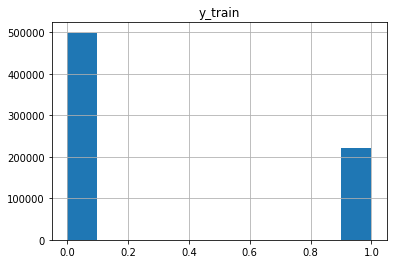

In [12]:
#посмотрим как распределены целевые признаки
df_target.hist()

Наш датасет имеет 58 признаков и 1 целевой признак. По первичному анализу видим, что необходимо решать задачу классификации (2 класса: 1 и 0). Видим, что некоторые признаки имеют тип данных object (из-за наличия запятой вместо точки), переведем в тип float. Также все признаки имеют пропуски (за незнанием наименований признаков, можно попробовать пустые ячейки заполнить медианой), многие признаки имеют выбросы (можно проверить через boxplot и удалить те, которые выходят за межквартильный размах). Мультиколлинеарности между признаками отсутствуют, то есть при первичном анализе можно использовать все признаки. В среднем каждый признак имеет около 60-70 тыс. нулевых ячеек. Положительных классов (1) в 2,5 раза меньше чем отрицательных (0).

In [13]:
#Соединим feature и target для последующего анализа
df_total = df_feature.merge(df_target, left_index=True, right_index=True)
df_total.head()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,y_train
0,"-131,97405146667",12.0,"13,0",11.747860,1.0,2.0,"22,0","-27,750277493704",9.0,NaN,87.058083,"21,450413763523102",81.620517,-97.553036,16.0,-12.983080,"17,0",4.0,-18.099378,-6.732951,"4,0",5.0,1.0,5.0,"-17,9129890591338",12.0,11.0,51.471043,3.0,0.0,3.0,"2,0",18.831498,66.396910,-37.168058,NaN,4.046918,NaN,"-44,375920543996706",18.004199,-30.673090,3.361101,40.974956,0.0,11.0,-87.278260,"0,0",4.0,12.459805,3.0,"11,0",40.588345,16.957673,14.360604,"-53,415701398274706",NaN,NaN,-40.849368,1
1,"-48,3041715861774",9.0,"10,0",10.436009,1.0,NaN,"24,0","-25,703719919085497",8.0,0.0,16.009612,"-72,79126783832909",-6.461447,-57.383471,17.0,-16.861284,"17,0",3.0,16.198657,NaN,"4,0",2.0,1.0,NaN,"41,7047788312104",16.0,NaN,34.587850,NaN,1.0,5.0,"1,0",5.274965,143.517414,-31.440045,3.0,2.018794,31.639457,"-22,766313763779998",-34.725224,45.854345,2.832861,26.454657,0.0,10.0,-5.220776,"0,0",5.0,27.542202,2.0,NaN,27.113802,-61.457339,2.627029,"-39,6179932194784",24.686063,NaN,-45.108764,1
2,"100,069773659861",13.0,"11,0",18.929141,0.0,3.0,"23,0","-4,699424954438241",9.0,0.0,75.464985,"38,530414272099705",-35.334847,-74.046007,NaN,-7.208878,"16,0",NaN,-31.089034,10.123315,"5,0",6.0,3.0,7.0,"10,8242838031359",13.0,8.0,49.093965,1.0,NaN,4.0,"6,0",20.984751,84.880973,-70.628745,NaN,1.217633,105.329939,"-29,320117178615497",1.742056,12.218403,-2.028582,49.873473,1.0,11.0,-98.563257,"0,0",3.0,18.594894,3.0,"16,0",-6.896243,54.733047,-2.216517,"-35,2871838640482",25.040067,NaN,-47.242583,0
3,"-25,5087416417462",13.0,"12,0",46.259050,0.0,3.0,"23,0","1,2425417539191599",8.0,1.0,-114.959430,NaN,NaN,-113.523562,16.0,-3.478059,"17,0",6.0,-0.291220,-30.995198,"8,0",3.0,1.0,NaN,"39,1266106064488",17.0,12.0,48.913728,1.0,2.0,4.0,"3,0",4.363940,85.951710,-71.353546,3.0,0.331994,NaN,"-16,741315467876998",NaN,-25.815625,-1.133774,44.798576,1.0,NaN,-0.554252,"0,0",NaN,20.084705,2.0,"15,0",55.000612,-4.505556,38.156216,"-1,7639836715336101",34.969627,46.036218,-33.329253,0
4,"82,3194077384192",11.0,NaN,56.106711,NaN,2.0,"23,0","-55,3530578444829",7.0,0.0,-15.661521,"-64,498249348253",NaN,-109.187610,17.0,2.200664,"17,0",3.0,-72.580830,18.359769,"8,0",7.0,2.0,7.0,NaN,NaN,11.0,41.238975,3.0,0.0,3.0,"3,0",11.930483,110.830770,-38.291125,3.0,0.185845,60.799044,"-13,473520432564198",9.043501,12.348260,2.928347,NaN,1.0,10.0,-52.169032,"0,0",4.0,22.172242,2.0,"12,0",16.842511,-7.187769,60.228568,"-59,8615288163502",36.044706,36.613905,-10.534727,0


In [14]:
#Проведем замену типа object во float
for i in df_feature.columns:
    if df_feature[i].dtype == 'object':
        df_total[i] = df_total[i].str.replace(',', '.')
        df_total[i] = df_total[i].astype('float')

In [15]:
#Проверим повторно корреляцию и статистические данные
df_total.corr()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,y_train
feature_1,1.000000,0.002110,-0.000520,-0.000695,-0.000263,-0.001689,-0.000015,-0.001210,-0.001317,0.001150,0.000235,-0.000341,-0.002622,0.000164,-0.001603,0.000571,-0.000570,-0.002755,0.000836,0.001043,0.000169,-0.004600,-0.001239,-0.001564,0.000685,0.001825,-0.001167,-0.000934,-0.003191,-0.001037,0.001649,0.000888,-0.000762,0.000064,0.001125,-1.406268e-05,0.001524,-0.000478,0.000741,-0.000200,-0.001654,0.000153,-0.001808,0.000649,0.000368,-0.001529,-0.001832,-0.000057,0.000554,-0.001309,0.000092,-0.001261,0.000146,-0.001560,-0.001625,-0.001825,0.000789,-2.194125e-03,-0.000003
feature_2,0.002110,1.000000,-0.001717,0.001180,-0.000733,0.000663,-0.001905,-0.000403,-0.000724,-0.001049,0.001190,-0.001250,-0.001446,-0.001104,0.002208,0.000894,0.000300,-0.002241,-0.001193,0.000027,0.001318,0.001144,-0.000227,-0.000517,0.000600,-0.002269,0.001407,-0.000509,0.002035,-0.001078,0.000174,0.000445,-0.000543,0.001047,-0.001068,1.449142e-03,0.001490,-0.000442,0.001171,0.000394,0.000740,0.001071,0.000114,0.000463,0.002081,-0.000472,-0.000133,-0.000702,0.000975,0.000625,-0.001059,0.000557,0.000262,0.001479,0.000660,0.001022,-0.000224,1.979766e-03,-0.000248
feature_3,-0.000520,-0.001717,1.000000,-0.000380,0.000203,0.000077,-0.000111,0.000396,-0.001065,-0.002127,-0.001281,-0.000024,-0.000367,0.002126,-0.000756,0.002184,-0.000998,0.000803,-0.000674,0.001174,0.001849,-0.002588,0.001061,0.000208,0.000148,-0.000965,-0.000063,-0.000248,0.001254,-0.002129,0.003505,-0.000878,-0.001260,0.000141,0.000093,-4.011919e-04,0.000318,-0.000559,0.001116,0.001012,-0.000160,-0.000273,-0.002587,-0.000166,0.001968,0.002593,-0.000231,-0.000922,-0.001028,0.000334,0.001288,-0.002638,-0.000496,0.001301,0.000826,-0.000203,0.002741,-1.563502e-03,-0.001832
feature_4,-0.000695,0.001180,-0.000380,1.000000,0.000602,0.000234,-0.000751,0.000101,0.000938,-0.000376,0.001611,-0.001539,-0.000043,-0.001390,-0.001633,-0.000844,0.002663,0.001515,-0.000809,-0.000792,-0.003714,-0.002089,-0.001585,0.000894,0.000825,-0.000331,0.000179,-0.000248,-0.001054,0.000423,0.001880,-0.000248,0.000694,-0.001447,-0.000800,-1.643938e-04,0.003287,0.001337,-0.001046,-0.000026,-0.000739,-0.002815,-0.000736,-0.000354,0.001023,-0.000817,0.001118,-0.002488,0.001732,0.000323,-0.002312,-0.001438,0.000436,-0.000595,0.000968,-0.000176,-0.001019,-1.236281e-03,0.000747
feature_5,-0.000263,-0.000733,0.000203,0.000602,1.000000,-0.000167,-0.000029,0.000669,0.000671,0.001005,0.003491,-0.001668,-0.000823,-0.001936,0.002471,-0.000357,-0.000526,-0.001688,-0.001434,0.000240,0.001094,0.000795,0.001283,0.000616,-0.001404,0.000811,0.000090,-0.000338,-0.001826,0.001932,0.001501,0.000003,0.001368,0.001373,-0.001801,1.703988e-03,0.001086,-0.001686,-0.001097,0.001748,0.000047,0.000985,0.003005,-0.000851,0.000863,0.000898,-0.001391,-0.000935,-0.001620,0.000312,-0.000705,-0.000599,0.000003,0.000157,0.002044,-0.000852,-0.000936,4.309336e-05,0.001242
feature_6,-0.001689,0.000663,0.000077,0.000234,-0.000167,1.000000,-0.000531,0.001893,-0.001254,0.000893,-0.001846,-0.000917,-0.000861,0.000945,-0.000153,0.001688,-0.001245,-0.000427,0.000691,0.002608,0.001306,-0.000920,0.000943,-0.000404,-0.001734,-0.000068,0.001416,0.000195,0.000495,-0.002104,0.001466,0.000542,0.003018,0.000104,0.000915,8.155099e-04,0.000807,-0.000382,-0.000382,-0.001663,-0.001041,0.000201,0.000170,0.000136,-0.000011,-0.000751,0.000311,-0.000

Также корреляция практически отсутствует

In [16]:
df_total.describe()

,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,y_train
count,656351.000000,647084.000000,665252.000000,662312.000000,655438.000000,637388.000000,633071.000000,637224.000000,672108.000000,635192.000000,633531.000000,657614.000000,641144.000000,658199.000000,628189.000000,657553.000000,643402.000000,646214.000000,685924.000000,663822.000000,643262.000000,651121.000000,614819.000000,658801.000000,647526.000000,658645.000000,634078.000000,649592.000000,629457.000000,657530.000000,662432.000000,656894.000000,652531.000000,652843.000000,640849.000000,652054.000000,665423.000000,653380.000000,649696.000000,629138.000000,666334.000000,675845.000000,656060.000000,635410.000000,644873.000000,656647.000000,651011.000000,646358.000000,643118.000000,669191.000000,638940.000000,674824.000000,651071.000000,650024.000000,640653.000000,650393.000000,668272.000000,628731.000000,720000.000000
mean,11.076267,12.329582,11.342324,25.416516,0.313636,2.181676,23.222787,-46.308927,7.902202,0.269337,18.853433,-0.040561,34.269546,-75.806768,17.017988,-10.156159,16.486980,3.263199,-12.368892,-0.454454,3.997628,4.528842,1.943738,5.241123,-4.227296,13.804578,12.943482,51.498964,3.087426,0.479967,3.702774,3.680215,12.464287,94.001096,-40.168157,3.567278,12.817623,58.121173,-6.121302,-16.356616,-16.151158,1.002550,33.459435,0.873631,10.854430,-22.315613,0.180594,4.150677,20.600971,2.982449,14.680834,24.038880,-19.310761,16.435223,-25.780107,26.151189,38.319160,-37.014484,0.306733
std,100.034568,0.796751,1.662567,20.630278,0.537229,0.770063,0.867250,19.882869,1.285814,0.443616,49.589405,57.774428,48.882319,36.291880,1.593426,7.033101,1.702716,1.564043,47.749934,16.888788,2.001177,1.679696,0.826889,1.902721,30.496909,2.066903,2.375069,8.740532,1.592861,0.658157,0.981093,1.474226,9.490661,33.014144,26.888467,1.661151,699.298602,47.030134,14.917694,18.118923,49.911629,3.001208,9.095184,0.787450,1.018276,35.161461,0.384682,1.679947,6.410183,1.097317,2.302040,29.136748,47.645051,45.110325,23.578277,8.513754,5.990176,15.250778,0.461138
min,-480.088690,7.000000,3.000000,-72.310070,0.000000,0.000000,17.000000,-138.181159,1.000000,0.000000,-209.150651,-99.999949,-189.175571,-242.437483,8.000000,-42.982325,7.000000,0.000000,-269.369596,-83.560468,0.000000,0.000000,0.000000,0.000000,-146.801871,3.000000,2.000000,8.707719,0.000000,0.000000,0.000000,0.000000,-32.011616,-67.543979,-169.554805,0.000000,0.001055,-182.790369,-77.903990,-94.393365,-242.543540,-13.849135,-9.012487,0.000000,4.000000,-201.520935,0.000000,0.000000,-10.115685,0.000000,4.000000,-115.421307,-246.217734,-197.419313,-136.146509,-14.899675,9.648201,-112.352665,0.000000
25%,-56.323033,12.000000,10.000000,11.521055,0.000000,2.000000,23.000000,-59.732242,7.000000,0.000000,-14.584958,-50.152792,1.309241,-100.322493,16.000000,-14.899146,15.000000,2.000000,-44.579503,-11.856749,3.000000,3.000000,1.000000,4.000000,-24.808879,12.000000,11.000000,45.599599,2.000000,0.000000,3.000000,3.000000,6.075057,71.707997,-58.333270,2.000000,0.540490,26.492465,-16.190606,-28.592796,-49.862114,-1.018706,27.325280,0.000000,10.000000,-46.107128,0.000000,3.000000,16.283152,2.000000,13.000000,4.389595,-51.505233,-13.991406,-41.726874,20.418159,34.263159,-47.302072,0.000000
50%,11.137026,13.000000,11.000000,25.435029,0.000000,2.000000,23.000000,-46.295015,8.000000,0.000000,18.769288,-0.091396,34.197230,-75.806723,17.000000,-10.157789,17.000000,3.000000,-12.3

In [17]:
#mean +/- 3 * std входят 99,7% признаков. Все что не входит в данный диапазон, будем считать выбросами
columns = []
for i in df_total.columns:
    if (df_total[i].mean() + 3 * df_total[i].std() < df_total[i].max()): #можно проверить только одну границу 
    #(если хотя бы одна удовлетворяет условию, то можем считать, что признак имеет выбросы)
        columns.append(i)

In [18]:
len(columns)

42

Из 59 признаков, 42 признака имеют выбросы.

In [19]:
#Сгенерируем цвета для каждого boxplot'a
N = len(columns)
cmap = plt.cm.get_cmap("hsv", N+1)

In [20]:
#построим boxplot'ы
boxplot(df_total)

Наиболее сильный разброс мы видим в 37 feature, хотя 75% значений находятся в диапазоне до 3,28.

In [21]:
#построим гистограммы
kdeplot(df_total)

# 2. Предобработка данных

In [22]:
#Проверим отношение нулевых ячеек к общему числу
null = df_total.isnull().sum()
division = round((null / len(df_total)) * 100, 1)

df_null = pd.DataFrame({'percent':division,
                     'sum_nan':null})
df_null[df_null['percent']>5].sort_values(by='percent', ascending=False)

,percent,sum_nan
feature_23,14.6,105181
feature_15,12.8,91811
feature_58,12.7,91269
feature_40,12.6,90862
feature_29,12.6,90543
feature_7,12.1,86929
feature_11,12.0,86469
feature_27,11.9,85922
feature_10,11.8,84808
feature_44,11.7,84590


feature_23 имеет самый большой процент пропусков 14,6%. Удалять столько строк является нецелесообразно.

In [23]:
#Перед проведением предобработки данных необходимо их разбить на 3 выборки: обучающую, валидационную и тестовую выборки
train, valid = train_test_split(df_total, test_size=0.4, random_state=42, stratify=df_total['y_train'])
valid, test = train_test_split(valid, test_size=0.5, random_state=42, stratify=valid['y_train'])

In [24]:
print('Кол-во меток в train: ', np.bincount(train['y_train']))
print('Кол-во меток в valid: ', np.bincount(valid['y_train']))
print('Кол-во меток в test: ', np.bincount(test['y_train']))

Кол-во меток в train:  [299491 132509]
Кол-во меток в valid:  [99830 44170]
Кол-во меток в test:  [99831 44169]


In [25]:
%%time
#По графикам видим, что у нас нормальное распределение, попробуем заполнить пропуски случайными числами из этого диапазона,
#дабы сохранить нормальное распределение
train = pass_search(train)
valid = pass_search(valid)
test = pass_search(test)

E:\python\lib\site-packages\pandas\core\indexing.py:965: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


Wall time: 3min 39s


In [26]:
%%time
train = del_blowout(train)
valid = del_blowout(valid)
test = del_blowout(test)

Wall time: 7.79 s


In [27]:
print('Кол-во меток в train после удаления выбросов: ', np.bincount(train['y_train']))
print('Кол-во меток в valid после удаления выбросов: ', np.bincount(valid['y_train']))
print('Кол-во меток в test после удаления выбросов: ', np.bincount(test['y_train']))

Кол-во меток в train после удаления выбросов:  [261278 115471]
Кол-во меток в valid после удаления выбросов:  [89777 39781]
Кол-во меток в test после удаления выбросов:  [89278 39451]


Теперь почти все значения признаков находятся в пределах

In [28]:
#Проверим распределения признаков после предобработки
kdeplot(train)

In [29]:
kdeplot(valid)

In [30]:
kdeplot(test)

Нормальное распределение сохраняется

In [31]:
#Разобьем наши выборки на feature и target
X_train = train.drop(['y_train'], axis=1)
y_train = train['y_train']

X_valid = valid.drop(['y_train'], axis=1)
y_valid = valid['y_train']

X_test = test.drop(['y_train'], axis=1)
y_test = test['y_train']

In [32]:
#Проведем нормализацию признаков
sc = StandardScaler()

sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_valid_std = sc.transform(X_valid)
X_test_std = sc.transform(X_test)

# 3. Выбор модели

Для выбора модели мы проверим 3 модели машинного обучения: случайный лес, логистическая регрессия и градиентный бустинг. Для каждой модели подберем гиперпараметры, при которой функция потерь будет минимальной, проверим метрику roc_auc и проведем замер времени выполнения каждой модели.

In [33]:
%%time
rfc = RandomForestClassifier(random_state = 42, n_jobs = -1)
parameters_rfc = {'n_estimators' : range(2,18,5),
                  'max_depth': range(2,9,2),
                  'class_weight': ['balanced', 'balanced_subsample']}

grid = GridSearchCV(rfc, parameters_rfc, scoring = 'roc_auc')
grid.fit(X_train_std, y_train)
grid.best_params_

Wall time: 9min 15s


{'class_weight': 'balanced', 'max_depth': 8, 'n_estimators': 17}

In [34]:
rfc = RandomForestClassifier(n_estimators = grid.best_params_['n_estimators'], max_depth = grid.best_params_['n_estimators'],
                             class_weight = grid.best_params_['class_weight'], random_state = 12345, n_jobs = -1)
rfc.fit(X_train_std, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=17, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=17, n_jobs=-1,
                       oob_score=False, random_state=12345, verbose=0,
                       warm_start=False)

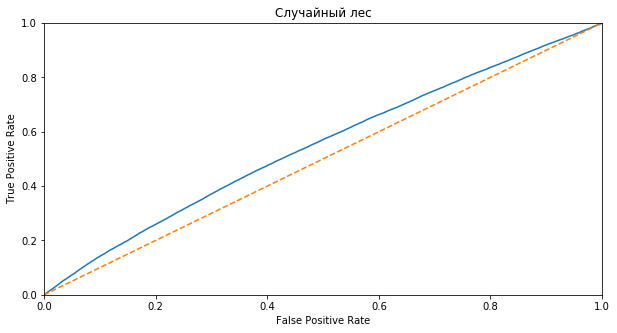

Площадь под кривой =  0.5491334546601093


In [35]:
auc_roc_chart(X_valid_std, y_valid, rfc, 'Случайный лес')

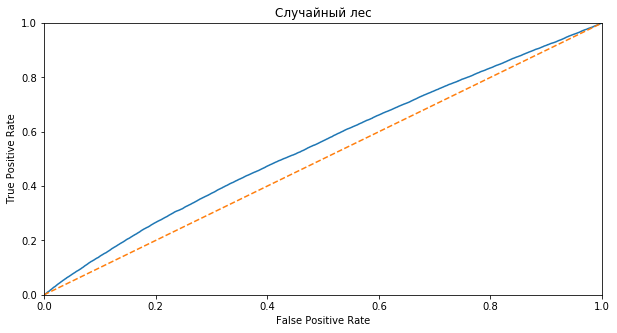

Площадь под кривой =  0.5491946734153978


In [36]:
auc_roc_chart(X_test_std, y_test, rfc, 'Случайный лес')

In [37]:
#Оценим важность признаков в порядке убывания
feat_labels = df_feature.columns[0:]
rfc.fit(X_train_std, y_train)
importances = rfc.feature_importances_
indices = np.argsort(importances)[::-1]
for f in range(X_train.shape[1]):
    print("%2d) %-*s %f" % (f+1, 30,
                            feat_labels[indices[f]],
                            importances[indices[f]]))

 1) feature_34                     0.079919
 2) feature_37                     0.031543
 3) feature_42                     0.025870
 4) feature_38                     0.024468
 5) feature_52                     0.024453
 6) feature_12                     0.024432
 7) feature_1                      0.024122
 8) feature_14                     0.024044
 9) feature_57                     0.023840
10) feature_20                     0.023832
11) feature_49                     0.023660
12) feature_28                     0.023603
13) feature_54                     0.023567
14) feature_13                     0.023354
15) feature_4                      0.023240
16) feature_35                     0.023219
17) feature_58                     0.023187
18) feature_16                     0.023052
19) feature_19                     0.022968
20) feature_53                     0.022941
21) feature_40                     0.022899
22) feature_56                     0.022614
23) feature_39                  

In [38]:
col = []
for f in range(X_train.shape[1]):
    if importances[indices[f]] > 0.02:
        col.append(feat_labels[indices[f]])
        
sc.fit(X_train.loc[:,col])
X_train_std_col = sc.transform(X_train.loc[:,col])
X_valid_std_col = sc.transform(X_valid.loc[:,col])
X_test_std_col = sc.transform(X_test.loc[:,col])

In [39]:
rfc.fit(X_train_std_col, y_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight='balanced',
                       criterion='gini', max_depth=17, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=17, n_jobs=-1,
                       oob_score=False, random_state=12345, verbose=0,
                       warm_start=False)

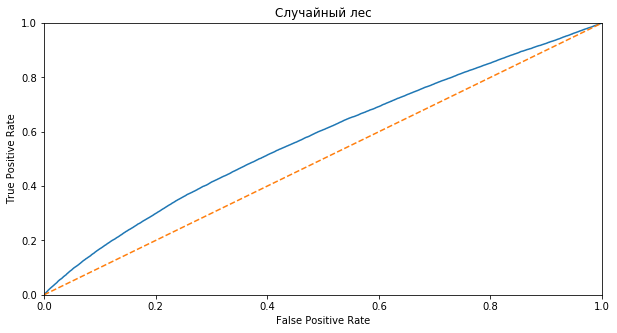

Площадь под кривой =  0.5764679198840212


In [40]:
auc_roc_chart(X_valid_std_col, y_valid, rfc, 'Случайный лес')

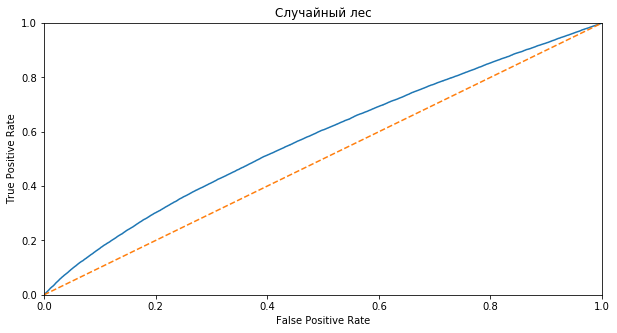

Площадь под кривой =  0.5765878818098549


In [41]:
auc_roc_chart(X_test_std_col, y_test, rfc, 'Случайный лес')

In [42]:
#оценим метрику roc_auc через кросс-валидацию
data = pd.concat([train, valid]).reset_index(drop=True)
features = data.drop(['y_train'], axis=1)
target = data['y_train']
final_score = cross_val_score(rfc, features, target, cv=10, scoring = 'roc_auc').mean()
print('ROC_AUC = ', final_score)

ROC_AUC =  0.5541997378530055


In [43]:
%%time
lr = LogisticRegression(random_state = 42, n_jobs = -1)
parameters_lr = {'penalty' : [None, 'l1', 'l2'],
                  'C': [0.001, 0.01, 0.1, 1.0, 10.0, 100.0],
                'solver': ['liblinear', 'lbfgs']}

grid = GridSearchCV(lr, parameters_lr, scoring = 'roc_auc')
grid.fit(X_train_std, y_train)
grid.best_params_

E:\python\lib\site-packages\sklearn\model_selection\_validation.py:536: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
ValueError: Logistic Regression supports only penalties in ['l1', 'l2', 'elasticnet', 'none'], got None.

  FitFailedWarning)
E:\python\lib\site-packages\sklearn\linear_model\_logistic.py:1539: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
E:\python\lib\site-packages\sklearn\linear_model\_logistic.py:1539: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
E:\python\lib\site-packages\sklearn\linear_model\_logistic.py:1539: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


Wall time: 2min 14s


{'C': 0.001, 'penalty': 'l1', 'solver': 'liblinear'}

In [44]:
lr = LogisticRegression(penalty = grid.best_params_['penalty'], C = grid.best_params_['C'], solver = grid.best_params_['solver'],
                        random_state = 42, n_jobs = -1)
lr.fit(X_train_std, y_train)

E:\python\lib\site-packages\sklearn\linear_model\_logistic.py:1539: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))


LogisticRegression(C=0.001, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=-1, penalty='l1', random_state=42,
                   solver='liblinear', tol=0.0001, verbose=0, warm_start=False)

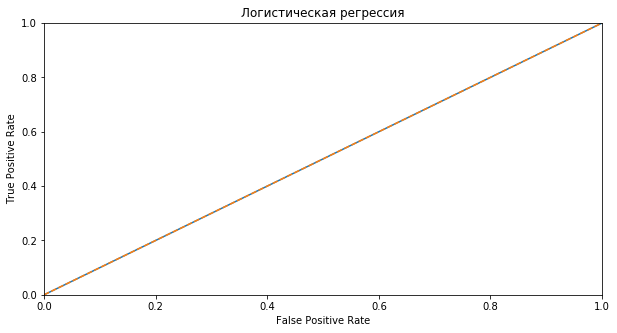

Площадь под кривой =  0.5


In [45]:
auc_roc_chart(X_valid_std, y_valid, lr, 'Логистическая регрессия')

In [46]:
final_score = cross_val_score(lr, features, target, cv=10, scoring = 'roc_auc').mean()
print('ROC_AUC = ', final_score)

E:\python\lib\site-packages\sklearn\linear_model\_logistic.py:1539: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
E:\python\lib\site-packages\sklearn\linear_model\_logistic.py:1539: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
E:\python\lib\site-packages\sklearn\linear_model\_logistic.py:1539: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
E:\python\lib\site-packages\sklearn\linear_model\_logistic.py:1539: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
E:\python\lib\site-packages\sklearn\linear_model\_logistic.py:1539: UserWarning: 'n_jobs' > 1 does not h

ROC_AUC =  0.5000610952844238


In [47]:
%%time
cbc = CatBoostClassifier(loss_function = 'Logloss', random_state = 42)
parameters_cbc = {'n_estimators' : range(2,18,5),
                  'depth': range(2,9,2) }

grid = GridSearchCV(cbc, parameters_cbc, scoring = 'roc_auc')
grid.fit(X_train_std, y_train)
grid.best_params_

Learning rate set to 0.5
0:	learn: 0.6348322	total: 94.9ms	remaining: 94.9ms
1:	learn: 0.6208003	total: 135ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.6348343	total: 45.6ms	remaining: 45.6ms
1:	learn: 0.6207999	total: 85.6ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.6348350	total: 43.4ms	remaining: 43.4ms
1:	learn: 0.6208053	total: 83.8ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.6348336	total: 44.4ms	remaining: 44.4ms
1:	learn: 0.6208038	total: 85ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.6348321	total: 47.3ms	remaining: 47.3ms
1:	learn: 0.6208021	total: 96.8ms	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.6348322	total: 46.2ms	remaining: 277ms
1:	learn: 0.6208003	total: 85.7ms	remaining: 214ms
2:	learn: 0.6173771	total: 132ms	remaining: 176ms
3:	learn: 0.6165315	total: 182ms	remaining: 136ms
4:	learn: 0.6163151	total: 221ms	remaining: 88.4ms
5:	learn: 0.6156081	total: 258ms	remaining: 43ms
6:	learn: 0.6147612	total: 299ms	remaining: 0u

{'depth': 8, 'n_estimators': 17}

In [48]:
cbc = CatBoostClassifier(loss_function = 'Logloss', n_estimators = grid.best_params_['n_estimators'], 
                         depth = grid.best_params_['depth'], random_state = 12345)
cbc.fit(X_train_std, y_train)

Learning rate set to 0.5
0:	learn: 0.6346078	total: 118ms	remaining: 1.89s
1:	learn: 0.6174758	total: 244ms	remaining: 1.83s
2:	learn: 0.6138013	total: 373ms	remaining: 1.74s
3:	learn: 0.6127602	total: 481ms	remaining: 1.56s
4:	learn: 0.6094408	total: 606ms	remaining: 1.45s
5:	learn: 0.6052734	total: 712ms	remaining: 1.3s
6:	learn: 0.5993835	total: 832ms	remaining: 1.19s
7:	learn: 0.5928806	total: 945ms	remaining: 1.06s
8:	learn: 0.5878669	total: 1.06s	remaining: 942ms
9:	learn: 0.5846365	total: 1.17s	remaining: 818ms
10:	learn: 0.5819466	total: 1.28s	remaining: 699ms
11:	learn: 0.5798413	total: 1.4s	remaining: 584ms
12:	learn: 0.5775561	total: 1.52s	remaining: 468ms
13:	learn: 0.5759275	total: 1.64s	remaining: 352ms
14:	learn: 0.5740916	total: 1.77s	remaining: 236ms
15:	learn: 0.5727856	total: 1.89s	remaining: 118ms
16:	learn: 0.5710535	total: 1.98s	remaining: 0us


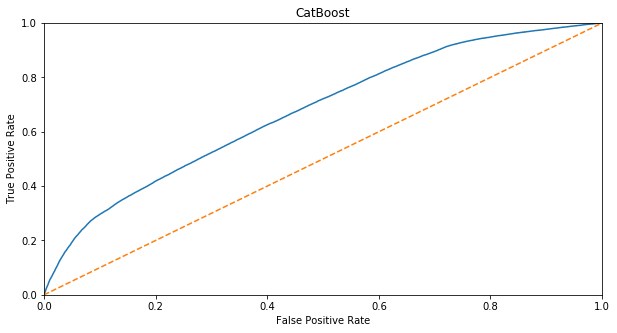

Площадь под кривой =  0.6759632939125925


In [49]:
auc_roc_chart(X_valid_std, y_valid, cbc, 'CatBoost')

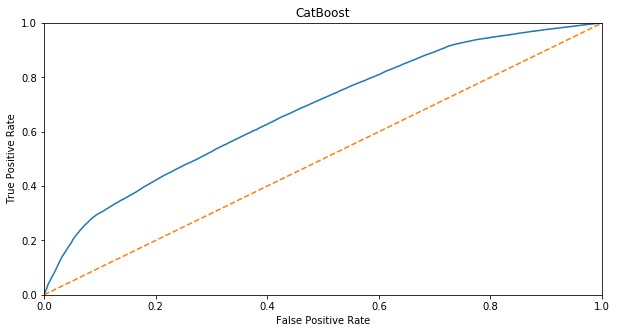

Площадь под кривой =  0.6769335843722776


In [50]:
auc_roc_chart(X_test_std, y_test, cbc, 'CatBoost')

In [51]:
final_score = cross_val_score(cbc, features, target, cv=10, scoring = 'roc_auc').mean()
print('ROC_AUC = ', final_score)

Learning rate set to 0.5
0:	learn: 0.6347622	total: 146ms	remaining: 2.33s
1:	learn: 0.6172359	total: 300ms	remaining: 2.25s
2:	learn: 0.6127805	total: 445ms	remaining: 2.08s
3:	learn: 0.6117886	total: 572ms	remaining: 1.86s
4:	learn: 0.6075610	total: 701ms	remaining: 1.68s
5:	learn: 0.6023036	total: 833ms	remaining: 1.53s
6:	learn: 0.5974328	total: 953ms	remaining: 1.36s
7:	learn: 0.5931931	total: 1.09s	remaining: 1.23s
8:	learn: 0.5881658	total: 1.23s	remaining: 1.09s
9:	learn: 0.5845918	total: 1.34s	remaining: 942ms
10:	learn: 0.5830236	total: 1.49s	remaining: 812ms
11:	learn: 0.5821234	total: 1.63s	remaining: 677ms
12:	learn: 0.5793645	total: 1.77s	remaining: 544ms
13:	learn: 0.5771674	total: 1.91s	remaining: 408ms
14:	learn: 0.5749647	total: 2.04s	remaining: 272ms
15:	learn: 0.5724775	total: 2.16s	remaining: 135ms
16:	learn: 0.5715552	total: 2.28s	remaining: 0us
Learning rate set to 0.5
0:	learn: 0.6347635	total: 145ms	remaining: 2.32s
1:	learn: 0.6175565	total: 293ms	remaining: 2

# Вывод

В ходе работы был проведен первичный анализ данных (исследовательский и статистический анализы, корреляция признаков, нахождение выбросов), предобработка данных (заполнение пустых ячеек, удаление выбросов, которые будут влиять на модель). В ходе задачи было выбрано 3 модели: Случайный лес, логистическая регрессия и градиентный бустинг. Для каждой модели подбирались гиперпараметры, при которых ROC_AUC будет максимальной. Также для сравнения метрик качества, проводилась кросс-валидация. По результатам, наилучшая метрика была получена при градиентном бустинге = 0.68, при кросс-валидацияя 0.67.<br>
Также для модели Случайный лес проводился выбор наиболее значимых признаков. После повторного обучения модели по наиболее значимым признакам, метрика качества не ухудшилась.<br>
По скорости обучения, наилучшая модель логистическая регрессия, но roc_auc = 0.5.